In [1]:
import numpy as np
import pandas as pd
from scipy.sparse import issparse
from pathlib import Path
import scanpy as sc
import geopandas as gpd
from sklearn_ann.kneighbors.annoy import AnnoyTransformer
# to install %pip install -q "scanpy" "sklearn-ann[annoy]"
import matplotlib.pyplot as plt
import scanpy.external as sce
import random


In [2]:
# set global seed
SEED = 1337

np.random.seed(SEED)
random.seed(SEED)

In [3]:
segmentation_path = Path("/Users/janzules/Roselab/Spatial/dietary_project/data/segmented_data/")
adata_file     = segmentation_path / "combined_adata.h5ad"
geneList = segmentation_path / "Gene_lists"
fig_out = Path("/Users/janzules/Roselab/Spatial/dietary_project/figures/cell_segmentation_result_analysis/Improving_clustering/")
ST_sample = sc.read_h5ad(adata_file)

In [4]:
ST_sample.obs['sample_id'].unique()

['F07833', 'F07834', 'F07835', 'F07836', 'F07837', 'F07838']
Categories (6, object): ['F07833', 'F07834', 'F07835', 'F07836', 'F07837', 'F07838']

In [5]:
# Cleaning
# Identify mitochondrial genes (prefix 'MT-' for human)
ST_sample.var['mito'] = ST_sample.var_names.str.startswith('mt-')

#  Run QC metrics
sc.pp.calculate_qc_metrics(
    ST_sample, 
    qc_vars=['mito'], 
    inplace=True, 
    log1p=False
)

In [6]:
sc.pp.filter_genes(ST_sample, min_cells=3)
# sc.pp.filter_cells(ST_sample, min_genes = 50)
ST_sample = ST_sample[
    (ST_sample.obs['total_counts'] >= 100) &
    (ST_sample.obs['pct_counts_mito'] <= 15)
].copy()

# All cells profiling

In [7]:
# Saving count data
ST_sample.layers["counts"] = ST_sample.X.copy()

In [8]:
# Immune scoring
immune_genes = [
    # T cells
    "Cd3e",   # pan-T cell marker (TCR complex)
    "Cd4",    # CD4+ T helper cells
    "Cd8a",   # CD8+ cytotoxic T cells
    "Foxp3",  # regulatory T cells (Tregs)
    "Pdcd1",  # exhausted T cells (PD-1)
    "Ctla4",  # inhibitory receptor, Tregs, exhausted T cells
    "Ptprc"   # CD45

    # NK cells
    "Ncr1",   # NK cell activating receptor
    "Prf1",   # perforin (cytotoxic granule, NK and CD8 T cells)
    "Gzmb",   # granzyme B (cytotoxic granule, NK and CD8 T cells)
    "Ifng",   # interferon-gamma (produced by NK and T cells)

    # B cells
    "Cd79a",  # B-cell receptor complex
    "Cd19",   # pan-B cell marker
    "Ms4a1",  # CD20 (B-cell marker)

    # Macrophages / Monocytes
    "Adgre1", # F4/80 (macrophage marker)
    "Itgam",  # CD11b (macrophages, monocytes, neutrophils)
    "Csf1r",  # macrophage colony-stimulating factor receptor
    "Mrc1",   # CD206, M2 macrophages (pro-tumor TAMs)

    # Dendritic cells (DCs)
    "Itgax",  # CD11c (dendritic cells)
    "H2-Ab1", # MHC class II (antigen presentation, DCs, macrophages)
    "Cd74",   # invariant chain for MHC II (antigen presentation)

    # MDSC / Neutrophils
    "Ly6g",   # neutrophils, granulocytic-MDSCs
    "S100a8", # neutrophils, MDSCs
    "S100a9", # neutrophils, MDSCs
    "Nos2",   # M1 macrophages, anti-tumor, nitric oxide synthase
    "Arg1",   # M2 macrophages, immunosuppressive MDSCs

    # Mast cells
    "Kit",    # stem cell factor receptor (mast cells)
    "Fcer1a", # high-affinity IgE receptor (mast cells)
    "Cpa3",   # mast cell-specific protease

    # General inflammatory mediators
    "Il1b",   # pro-inflammatory cytokine (macrophages, neutrophils)
    "Tnf"     # tumor necrosis factor alpha (broad immune activation)
]

sc.tl.score_genes(
    ST_sample,
    gene_list=immune_genes,
    score_name="Immune_score"
)

In [9]:
# Subsetting Immune cells

# Boolean mask of immune‐high cells
mask_immune = ST_sample.obs['Immune_score'] >= 0.1

# Subset + copy
adata_immune = ST_sample[mask_immune, :].copy()


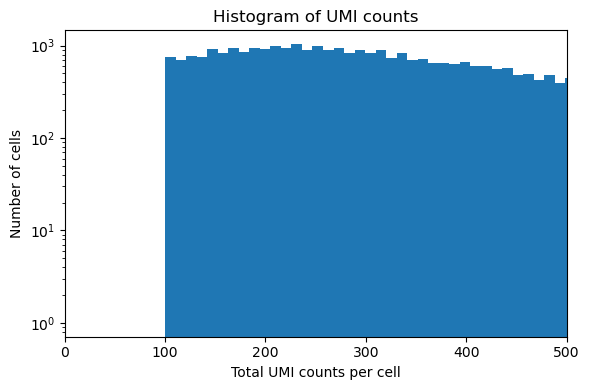

In [10]:
plt.figure(figsize=(6,4))
plt.hist(adata_immune.obs['total_counts'], bins=500)
plt.yscale('log')              # log y‐axis to see the tail more clearly
plt.xlabel('Total UMI counts per cell')
plt.ylabel('Number of cells')
plt.title('Histogram of UMI counts')
plt.xlim(0,500)
plt.tight_layout()
plt.show()

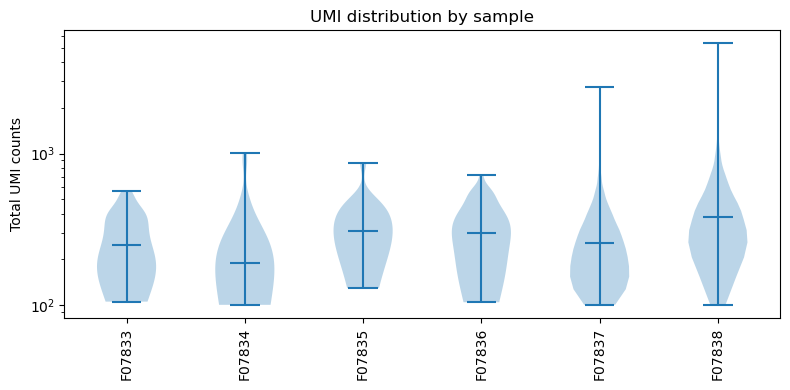

In [11]:
import matplotlib.pyplot as plt

# prepare data
df = adata_immune.obs[['sample_id','total_counts']]

# build one violin per sample
samples = df['sample_id'].cat.categories
data = [ df.loc[df['sample_id']==s, 'total_counts'] for s in samples ]

plt.figure(figsize=(8,4))
plt.violinplot(data, showmedians=True)
plt.xticks(range(1,len(samples)+1), samples, rotation=90)
plt.yscale('log')
plt.ylabel('Total UMI counts')
plt.title('UMI distribution by sample')
plt.tight_layout()
plt.show()


# Imune profiling

In [12]:
adata_immune

AnnData object with n_obs × n_vars = 37426 × 19016
    obs: 'id', 'mouse', 'sample_id', 'condition', 'cx', 'cy', 'TMA', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'pct_counts_mito', 'Immune_score'
    var: 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
    layers: 'counts'

In [13]:
# HVG selection
sc.pp.highly_variable_genes(
    adata_immune,
    n_top_genes=5000, #default 2k
    flavor="seurat_v3",
    # batch_key="TMA"
)
# adata_immune = adata_immune[:, adata_immune.var['highly_variable']].copy()

In [14]:
# sc.pp.regress_out(
#     ST_sample,
#     keys=['total_counts', 'pct_counts_mito']
# )

In [15]:
# # Identify cells with total counts > 0 after HVG filtering
# nonzero_cells = np.array(adata_immune.X.sum(axis=1)).flatten() > 0

# # Subset to only nonzero cells
# adata_immune = adata_immune[nonzero_cells, :].copy()

In [16]:
adata_immune.shape

(37426, 19016)

In [17]:
# normalize + log1p
sc.pp.normalize_total(adata_immune)
sc.pp.log1p(adata_immune)

In [18]:
# PCA with randomized SVD
n_pcs = 50
sc.tl.pca(adata_immune, n_comps=n_pcs, svd_solver="randomized")

/Users/janzules/anaconda3/envs/spatial_analysis_env/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:536: UserWarning: Ignoring svd_solver='randomized' and using arpack, sklearn.decomposition._pca.PCA (with sparse input) only supports dict_keys(['arpack', 'covariance_eigh']).
  warnings.warn(msg)


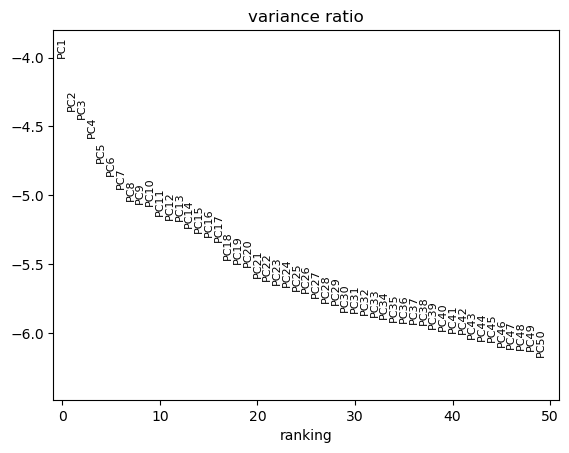

In [19]:
sc.pl.pca_variance_ratio(adata_immune, n_pcs=n_pcs, log=True)

In [20]:
pc_choice = 8

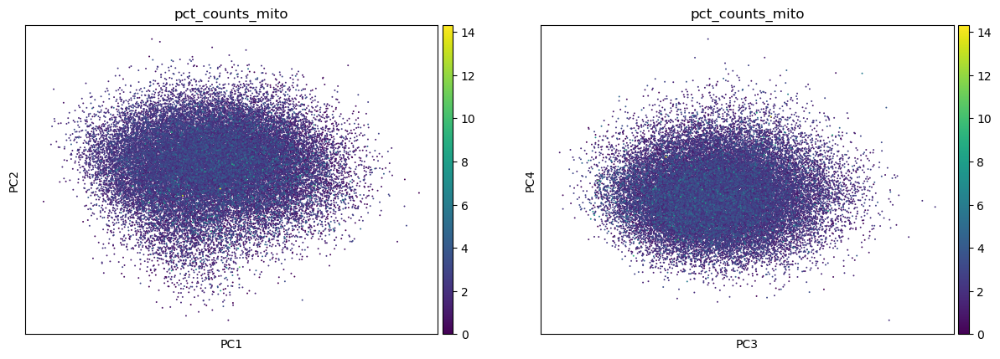

In [21]:
sc.pl.pca(
    adata_immune,
    color=["pct_counts_mito", "pct_counts_mito"],
    dimensions=[(0, 1), (2, 3)],
    ncols=2,
    size=8,
)

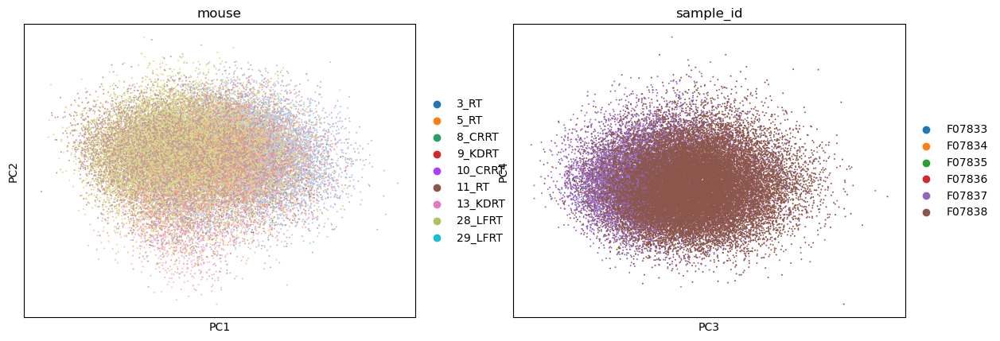

In [22]:
# First the categorical panels (no sorting needed)
sc.pl.pca(
    adata_immune,
    color=["mouse", "sample_id"],
    dimensions=[(0, 1), (2, 3)],
    ncols=2,
    size=8,
    sort_order=False,      # categorical won’t sort anyway
)

In [23]:
# Integration

sce.pp.harmony_integrate(
    adata_immune,
    key='sample_id',
    basis='X_pca',
    adjusted_basis='X_pca_harmony'
)

sc.pp.neighbors(
    adata_immune,
    n_neighbors=30,
    n_pcs=pc_choice,
    use_rep='X_pca_harmony',
    transformer=AnnoyTransformer(n_trees=100),
    method="umap",
    knn=True
)

2025-04-29 12:59:11,660 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-29 12:59:13,507 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-29 12:59:13,571 - harmonypy - INFO - Iteration 1 of 10
2025-04-29 12:59:17,196 - harmonypy - INFO - Iteration 2 of 10
2025-04-29 12:59:20,824 - harmonypy - INFO - Iteration 3 of 10
2025-04-29 12:59:24,442 - harmonypy - INFO - Iteration 4 of 10
2025-04-29 12:59:27,109 - harmonypy - INFO - Iteration 5 of 10
2025-04-29 12:59:28,946 - harmonypy - INFO - Iteration 6 of 10
2025-04-29 12:59:30,417 - harmonypy - INFO - Iteration 7 of 10
2025-04-29 12:59:31,776 - harmonypy - INFO - Iteration 8 of 10
2025-04-29 12:59:33,045 - harmonypy - INFO - Iteration 9 of 10
2025-04-29 12:59:34,483 - harmonypy - INFO - Iteration 10 of 10
2025-04-29 12:59:35,697 - harmonypy - INFO - Stopped before convergence
/Users/janzules/anaconda3/envs/spatial_analysis_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProg

In [24]:
# Memory efficient
sc.pp.neighbors(
    adata_immune,
    n_neighbors=30,
    n_pcs=pc_choice,
    transformer=AnnoyTransformer(n_trees=100),
    method="umap",
    knn=True
)

In [25]:
resl = 0.60
sc.tl.leiden(
    adata_immune,
    resolution=resl,
    flavor="igraph",
    n_iterations=2,
    random_state=1337
)

In [26]:
sc.tl.umap(
    adata_immune,
    init_pos='random'
)

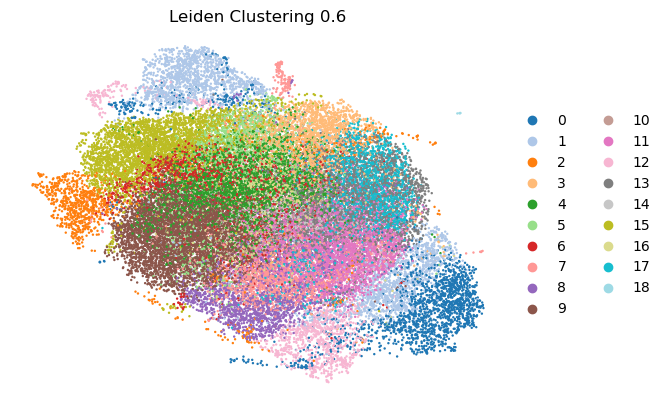

In [27]:
sc.pl.umap(
    adata_immune,
    color='leiden',    # color by your leiden clusters
    palette='tab20',   # nice large color palette
    size=12,            # small dots for large datasets (~1M cells)
    frameon=False,
    title=f'Leiden Clustering {resl}'
)

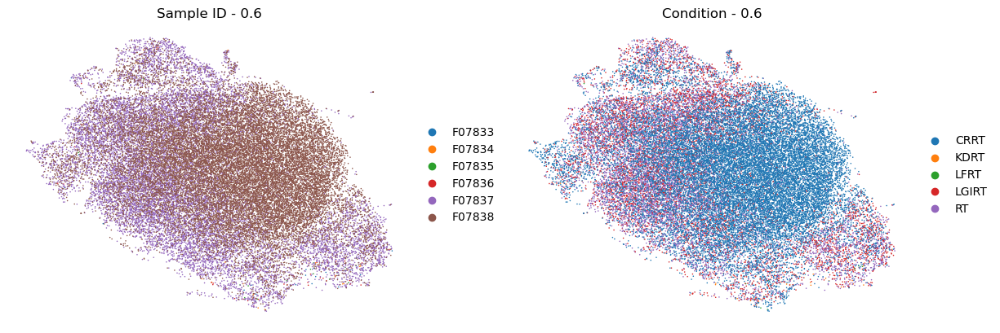

In [28]:
sc.pl.umap(
    adata_immune,
    color=['sample_id', 'condition'],
    ncols=3,            # one panel per key
    size=5,             # adjust dot size for visibility
    frameon=False,
    title=[f'Sample ID - {resl}', f'Condition - {resl}']
)


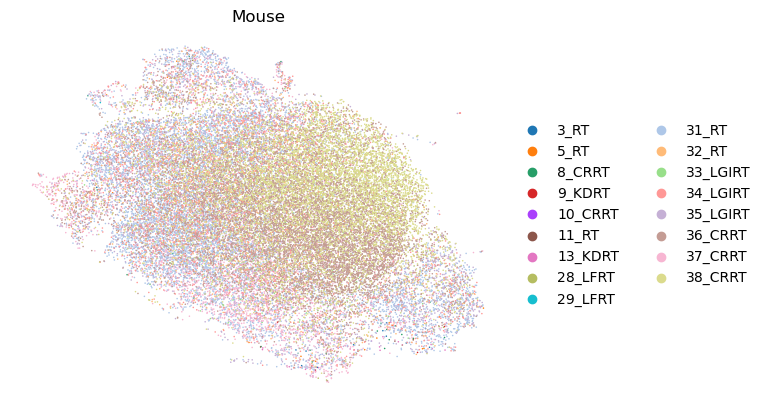

In [29]:
sc.pl.umap(
    adata_immune,
    color=['mouse'],
    ncols=3,            # one panel per key
    size=5,             # adjust dot size for visibility
    frameon=False,
    title=['Mouse']
)


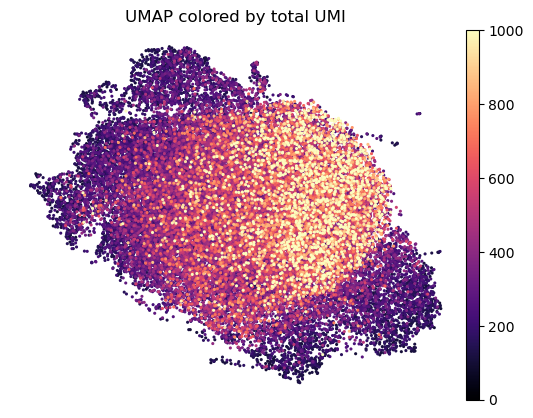

In [30]:
fig = sc.pl.umap(
    adata_immune,
    color='total_counts',
    cmap='magma',
    vmin=0, vmax=1000,
    size=20,
    frameon=False,
    title='UMAP colored by total UMI',
    show=False,
    return_fig=True
)


In [31]:
# sc.pl.umap(
#     adata_immune,
#     color=["PTENSKO_score", "MycCAP_score"],
#     size=5,
#     frameon=False,
#     cmap="viridis",
#     title=["PTEN-SKO module score", "Myc-CAP module score"]
# )

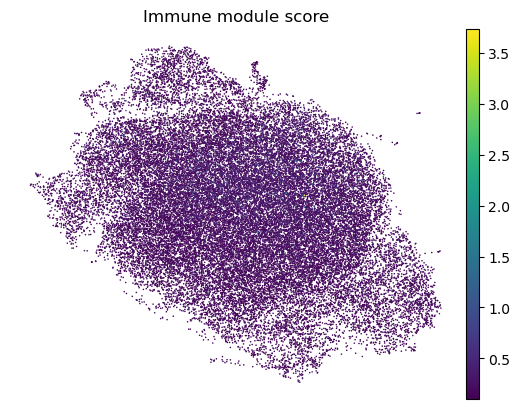

In [32]:
# UMAP overlay - Immune Score
sc.pl.umap(
    adata_immune,
    color="Immune_score",
    size=5,
    frameon=False,
    cmap="viridis",
    title="Immune module score"
)

In [33]:
# fig_out = Path("/Users/janzules/Roselab/Spatial/dietary_project/figures/cell_segmentation_result_analysis/Improving_clustering/")
# fig_out.mkdir(parents=True, exist_ok=True)

# sc.settings.figdir = fig_out
# sc.settings.set_figure_params(dpi=600)

# sc.pl.umap(
#     adata_immune,
#     color="Immune_score",
#     size=5,
#     frameon=False,
#     cmap="viridis",
#     title="Immune module score",
#     save="_immune_score_umap.png",   # produces .../umap_immune_score_umap.png
#     show=False
# )

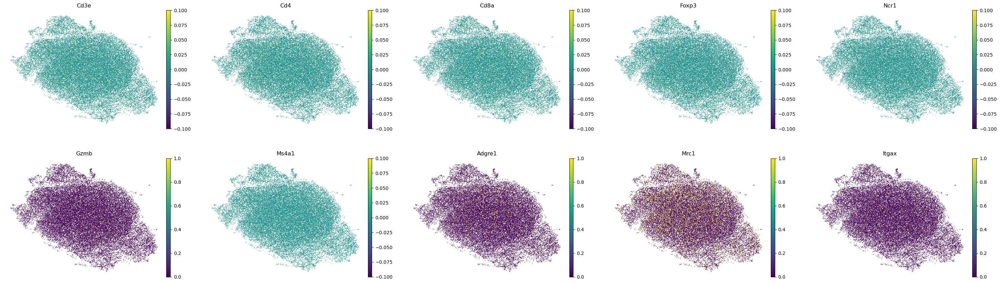

In [34]:
# Picked markers in the order you’d like them to appear left→right, top→bottom
genes_plot = [
    "Cd3e", "Cd4", "Cd8a", "Foxp3", "Ncr1",
    "Gzmb", "Ms4a1", "Adgre1", "Mrc1", "Itgax"
]

# Scanpy UMAP overlay
sc.pl.umap(
    adata_immune,
    color=genes_plot,
    ncols=5,                 # five panels per row → 2 rows for 10 genes
    size=5,                  # dot size – tweak for your DPI
    frameon=False,
    cmap="viridis",          # continuous colour map
    vmax="p99",              # clip extreme outliers for better contrast
    vmin="p01",
    layer = "counts",
    title=genes_plot         # one title per panel
)


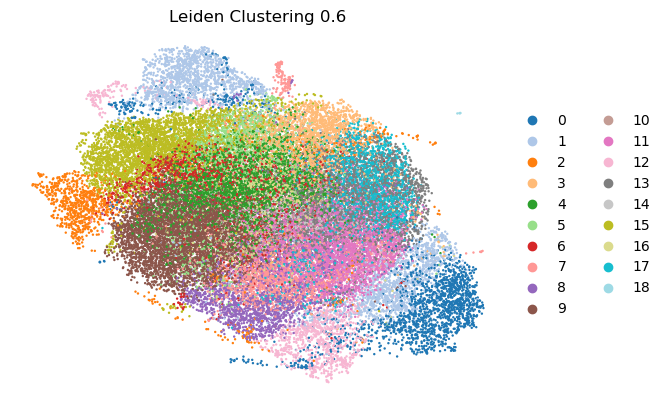

In [35]:
sc.pl.umap(
    adata_immune,
    color='leiden',    # color by your leiden clusters
    palette='tab20',   # nice large color palette
    size=12,            # small dots for large datasets (~1M cells)
    frameon=False,
    title=f'Leiden Clustering {resl}'
)

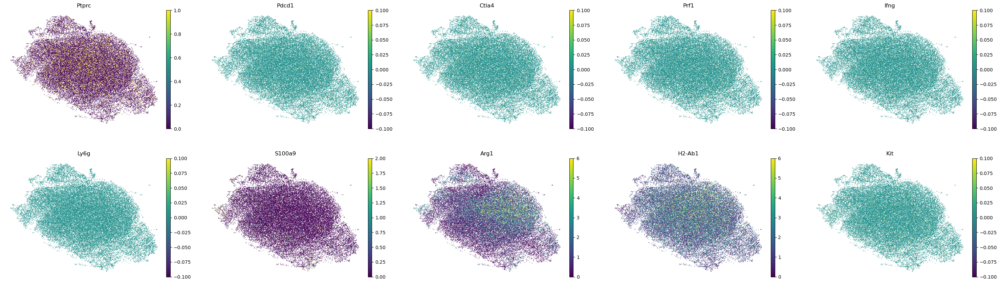

In [36]:
genes_plot2 = [
    "Ptprc", "Pdcd1", "Ctla4", "Prf1", "Ifng",
    "Ly6g",  "S100a9", "Arg1", "H2-Ab1", "Kit"
]

sc.pl.umap(
    adata_immune,
    color=genes_plot2,
    ncols=5,                 # 5 per row  → 2 rows
    size=5,
    frameon=False,
    cmap="viridis",
    vmax="p99",
    layer = "counts",
    title=genes_plot2
)


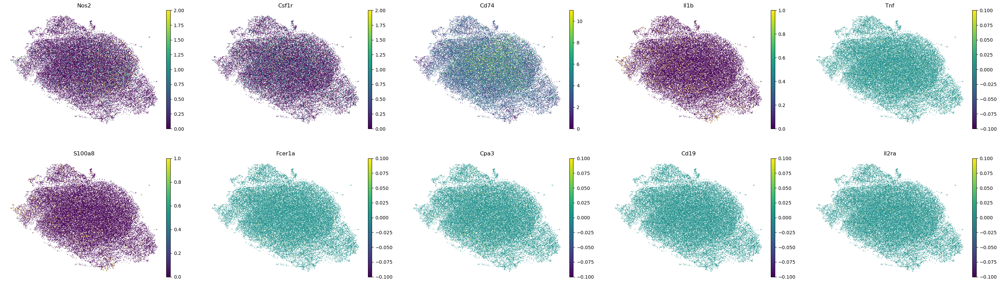

In [37]:
genes_plot3 = [
    "Nos2", "Csf1r", "Cd74", "Il1b", "Tnf",
    "S100a8", "Fcer1a", "Cpa3", "Cd19", "Il2ra"
]

sc.pl.umap(
    adata_immune,
    color=genes_plot3,
    ncols=5,
    size=5,
    frameon=False,
    cmap="viridis",
    vmax="p99",
    layer = "counts",
    title=genes_plot3
)